# Real Estate Valuation Prediction of New Taipei City.

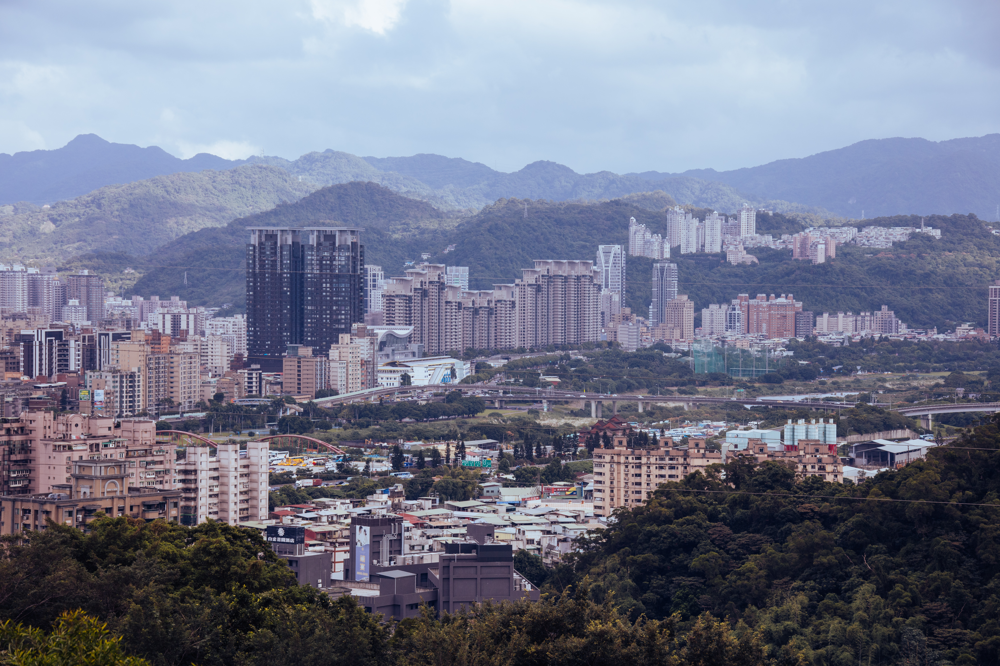
 
 Photo Credit : Wikipedia

## Problem Statement:

**The market historical data set of real estate valuation are collected from Xindian Dist., New Taipei City, 
Taiwan. The real estate valuation is a regression problem. The data set was randomly split into the training data set (2/3 samples) and the testing data set (1/3 samples).**
    
**Examining real estate valuation is essential for understanding residential preferences within a city. Higher property prices often indicate increased demand for certain locations, providing insights valuable for urban design and policies. Predictive modeling of real estate values can identify key factors influencing prices, aiding in informed decision-making for urban planning and policy implementation. The goal is to accurately predict property values based on various features, facilitating a deeper understanding of the dynamics shaping the real estate market.**


### Data Description:

**Dataset contains historical data from real estate market across 2012 to 2013, Sindian District, New Taipei City. Within the 
dataset, each row represents a transaction record of an real estate property, whereas each column corresponds to a feature describing that record. The dataset contains 414 records of property sales (414 rows).**

#### **Attributes**


**1. the transaction date (for example, 2013.250-2013 March, 2013.500-2013 June, etc.**

**2. the house age (unit: year)**

**3. the distance to the nearest MRT station (unit: meter)**

**4. the number of convenience stores in the living circle on foot (integer)**

**5. the geographic coordinate, latitude. (unit: degree)**

**6. the geographic coordinate, longitude. (unit: degree))**

**The output is as follows:**

**Target variable -- house price of unit area (10000 New Taiwan Dollar/Ping, where Ping is a local unit, 1
  Ping-3.3 meter squared)**

In [1]:
#libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set_style("whitegrid",{'grid.linestyle': '--'})

import warnings
warnings.filterwarnings("ignore")

In [2]:
#import dataset
df=pd.read_csv('Real estate valuation data set.csv')

In [3]:
#check few rows
df.head()

,No,X1 transaction date,X2 house age,X3 distance to the nearest MRT station,X4 number of convenience stores,X5 latitude,X6 longitude,Y house price of unit area
0,1,2012.917,32.0,84.87882,10,24.98298,121.54024,37.9
1,2,2012.917,19.5,306.59470,9,24.98034,121.53951,42.2
2,3,2013.583,13.3,561.98450,5,24.98746,121.54391,47.3
3,4,2013.500,13.3,561.98450,5,24.98746,121.54391,54.8
4,5,2012.833,5.0,390.56840,5,24.97937,121.54245,43.1


### Data Exploration and Cleaning

In [4]:
# Rename the columns names
df = df.rename(columns = {'X1 transaction date':'Date','X2 house age':'house_age','X3 distance to the nearest MRT station':'distance_to_nearest_mrt_station',
                          'X4 number of convenience stores':'number_of_convenience_stores',
                          'X5 latitude':'latitude','X6 longitude':'longitude','Y house price of unit area':'house_price'})

In [5]:
df.head()

,No,Date,house_age,distance_to_nearest_mrt_station,number_of_convenience_stores,latitude,longitude,house_price
0,1,2012.917,32.0,84.87882,10,24.98298,121.54024,37.9
1,2,2012.917,19.5,306.59470,9,24.98034,121.53951,42.2
2,3,2013.583,13.3,561.98450,5,24.98746,121.54391,47.3
3,4,2013.500,13.3,561.98450,5,24.98746,121.54391,54.8
4,5,2012.833,5.0,390.56840,5,24.97937,121.54245,43.1


In [61]:
# checking structure of data
df.shape

(414, 7)

In [6]:
#checking the datatypes
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 414 entries, 0 to 413
Data columns (total 8 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   No                               414 non-null    int64  
 1   Date                             414 non-null    float64
 2   house_age                        414 non-null    float64
 3   distance_to_nearest_mrt_station  414 non-null    float64
 4   number_of_convenience_stores     414 non-null    int64  
 5   latitude                         414 non-null    float64
 6   longitude                        414 non-null    float64
 7   house_price                      414 non-null    float64
dtypes: float64(6), int64(2)
memory usage: 26.0 KB


In [7]:
df.head()

,No,Date,house_age,distance_to_nearest_mrt_station,number_of_convenience_stores,latitude,longitude,house_price
0,1,2012.917,32.0,84.87882,10,24.98298,121.54024,37.9
1,2,2012.917,19.5,306.59470,9,24.98034,121.53951,42.2
2,3,2013.583,13.3,561.98450,5,24.98746,121.54391,47.3
3,4,2013.500,13.3,561.98450,5,24.98746,121.54391,54.8
4,5,2012.833,5.0,390.56840,5,24.97937,121.54245,43.1


In [8]:
#checking null or missing values
df.isnull().sum()

No                                 0
Date                               0
house_age                          0
distance_to_nearest_mrt_station    0
number_of_convenience_stores       0
latitude                           0
longitude                          0
house_price                        0
dtype: int64

In [66]:
#Descriptive Statistics
df.describe()

,Date,house_age,distance_to_nearest_mrt_station,number_of_convenience_stores,latitude,longitude,house_price
count,414.000000,414.000000,414.000000,414.000000,414.000000,414.000000,414.000000
mean,2013.148971,17.712560,1083.885689,4.094203,24.969030,121.533361,37.980193
std,0.281967,11.392485,1262.109595,2.945562,0.012410,0.015347,13.606488
min,2012.667000,0.000000,23.382840,0.000000,24.932070,121.473530,7.600000
25%,2012.917000,9.025000,289.324800,1.000000,24.963000,121.528085,27.700000
50%,2013.167000,16.100000,492.231300,4.000000,24.971100,121.538630,38.450000
75%,2013.417000,28.150000,1454.279000,6.000000,24.977455,121.543305,46.600000
max,2013.583000,43.800000,6488.021000,10.000000,25.014590,121.566270,117.500000


In [9]:
#Drop 'No' columns, it is not useful for further analysis
df = df.drop(columns = ['No'], axis = 1)

In [10]:
df.head()

,Date,house_age,distance_to_nearest_mrt_station,number_of_convenience_stores,latitude,longitude,house_price
0,2012.917,32.0,84.87882,10,24.98298,121.54024,37.9
1,2012.917,19.5,306.59470,9,24.98034,121.53951,42.2
2,2013.583,13.3,561.98450,5,24.98746,121.54391,47.3
3,2013.500,13.3,561.98450,5,24.98746,121.54391,54.8
4,2012.833,5.0,390.56840,5,24.97937,121.54245,43.1


### Outlier Detection

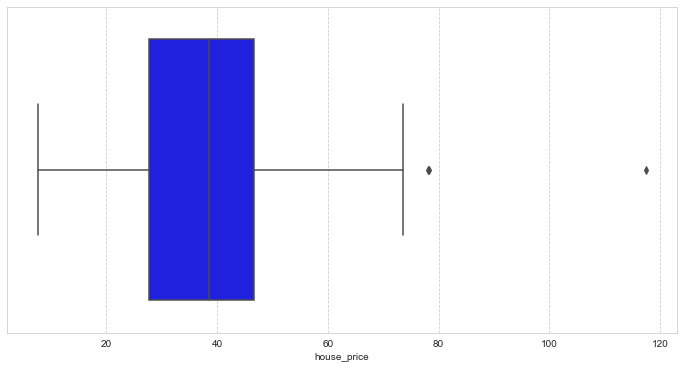

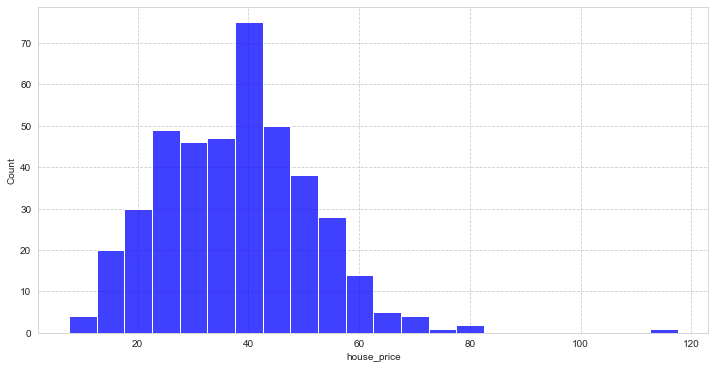

In [153]:
# cheking for target variable
plt.figure(figsize = (12,6))
sns.boxplot(df['house_price'],color ='blue')
plt.show()

print('==========================================================================================')

# distibution of target variable
plt.figure(figsize = (12,6))
sns.histplot(df['house_price'],color ='blue')
plt.show()

In [71]:
df.house_price.sort_values(ascending = False).head(10)

270    117.5
220     78.3
312     78.0
166     73.6
105     71.0
16      70.1
379     69.7
389     67.7
413     63.9
361     63.3
Name: house_price, dtype: float64

In our Dataset the house price has few outliers that can affect our analysis. one extreme observation is 1175000 NTD/ping.

House price of unit are varies significantly from 76000 NTD/ping to more than 1 million NTD/Ping.

Most of the house prices of unit area are lies between 250000 and 500000 NTD/Ping.

remove the observation that are beyond 780000 NTD/ping they are potential outliers.

In [95]:
# limit the data
house = df[df['house_price'] < 78.0]


In [96]:
house.head()

,Date,house_age,distance_to_nearest_mrt_station,number_of_convenience_stores,latitude,longitude,house_price
0,2012.917,32.0,84.87882,10,24.98298,121.54024,37.9
1,2012.917,19.5,306.59470,9,24.98034,121.53951,42.2
2,2013.583,13.3,561.98450,5,24.98746,121.54391,47.3
3,2013.500,13.3,561.98450,5,24.98746,121.54391,54.8
4,2012.833,5.0,390.56840,5,24.97937,121.54245,43.1


In [99]:
house.shape

(411, 7)

### Univariate Analysis

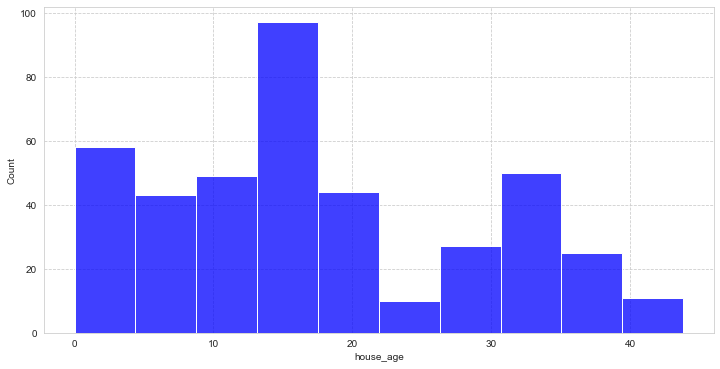

In [151]:
# checking distribution of house_age

plt.figure(figsize = (12,6))
sns.histplot(df['house_age'],color ='blue')
plt.show()

house age is varies from 0 to 43 years with peaks at 12 to 18 years.

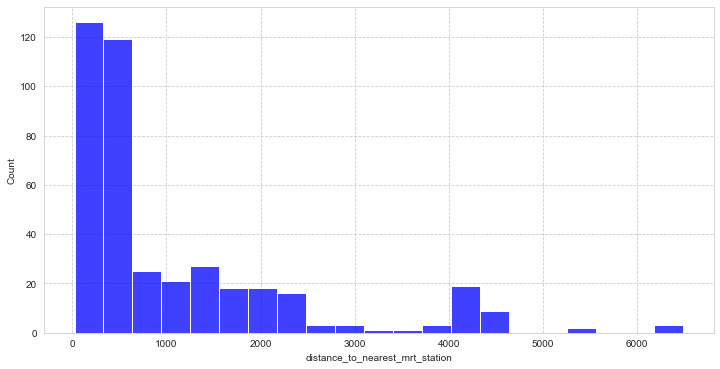

In [150]:
# spread of distance_to_nearest_mrt_station variable

plt.figure(figsize = (12,6))
sns.histplot(df['distance_to_nearest_mrt_station'],color ='blue')
plt.show()

Most of houses are lies within 1000 meters near to MRT(mass rapid transit) station.

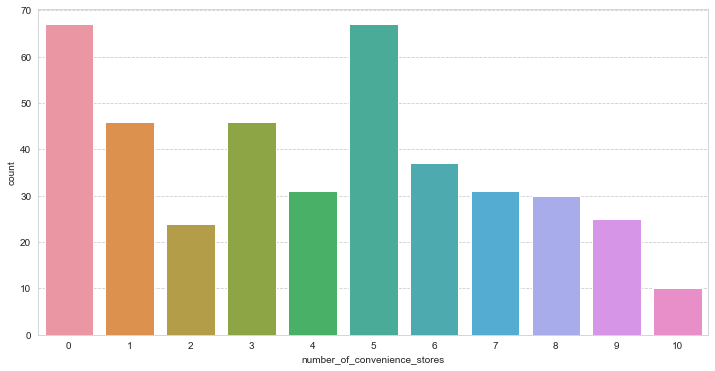

In [108]:
# distibution of number of convenience stores
plt.figure(figsize = (12,6))
sns.countplot(df['number_of_convenience_stores'])
plt.show()

It is observed that approximately one sixth of total houses has no convenience stores.

most of the houses has between 1 and 6 convenience stores in the living circle on foot.

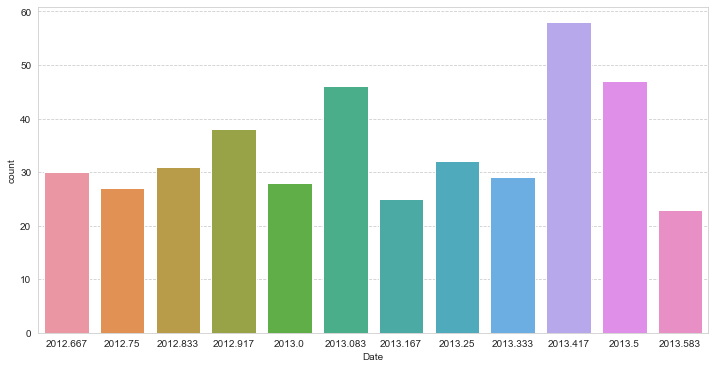

In [106]:
# Transcation Date
plt.figure(figsize = (12,6))
sns.countplot(df['Date'])
plt.show()

Number of transaction has increase in 2013 as compare to 2012.

### Bivariate Analysis

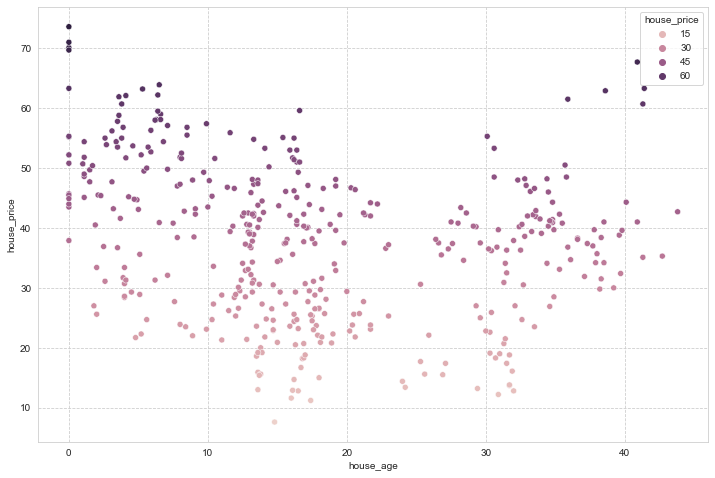

In [111]:
# house_price vs house_age
plt.figure(figsize = (12,8))
sns.scatterplot(data=house, x="house_age", y="house_price", hue="house_price")
plt.show()

- House prices of unit area varies as house age changes. Highest prices are observed for new houses that are less than 10 year     old and houses that are more than 30 years old.
  Apart from that other houses has house prices per unit area lies between 300000 NTD/ping and 450000 NTD/ping.

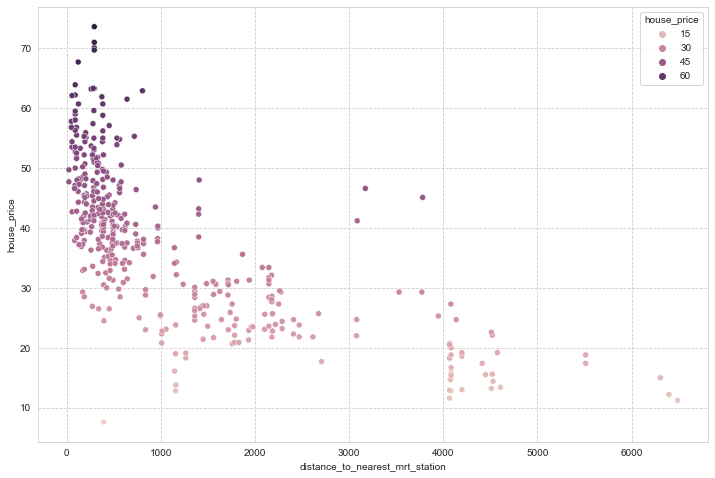

In [112]:
#house_price vs distance_to_nearest_mrt_station
plt.figure(figsize = (12,8))
sns.scatterplot(data=house, x="distance_to_nearest_mrt_station", y="house_price", hue="house_price")
plt.show()

- There is negative relationship between the house price per unit area and distance to nearest MRT station and it is obvious       that
  minimum distance between property and MRT station lead to increase in house price per unit area with a few exceptions.
  
  
- high value properties are located within 800 meter of distance from MRT stations.

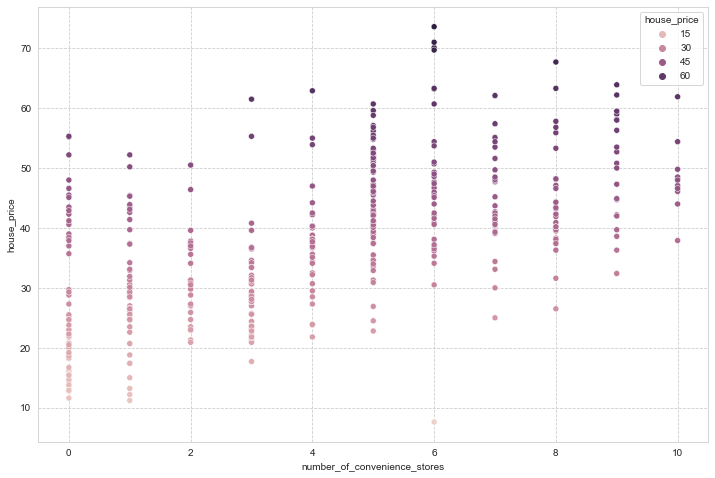

In [113]:
# house_price vs number_of_convenience_stores
plt.figure(figsize = (12,8))
sns.scatterplot(data=house, x="number_of_convenience_stores", y="house_price", hue="house_price")
plt.show()

 - There is positive trend between house price per unit area and no of convenience stores.

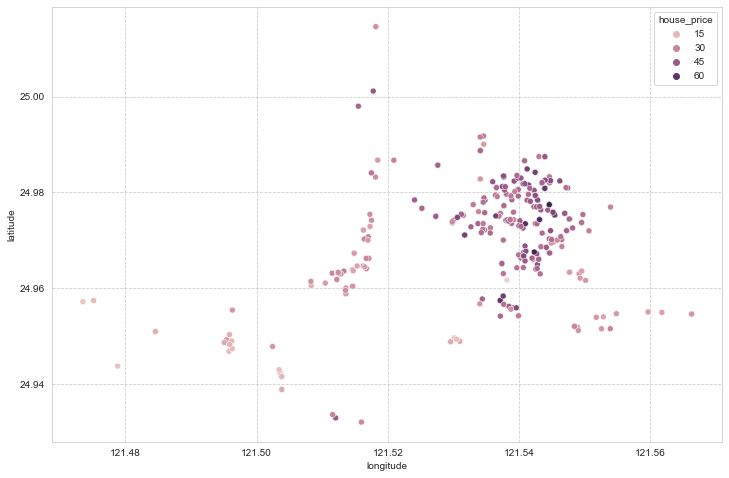

In [117]:
# longitude vs latitude
plt.figure(figsize = (12,8))
sns.scatterplot(data=house, x="longitude", y="latitude", hue="house_price")
plt.show()

In [189]:
# Average prices across years
year_avg = house.copy()

In [190]:
year_avg['year'] = year_avg['Date'].apply(lambda x: int(str(x)[:4]))

In [192]:
year_avg.groupby(['year'])['house_price'].mean()

year
2012    36.304762
2013    38.160000
Name: house_price, dtype: float64

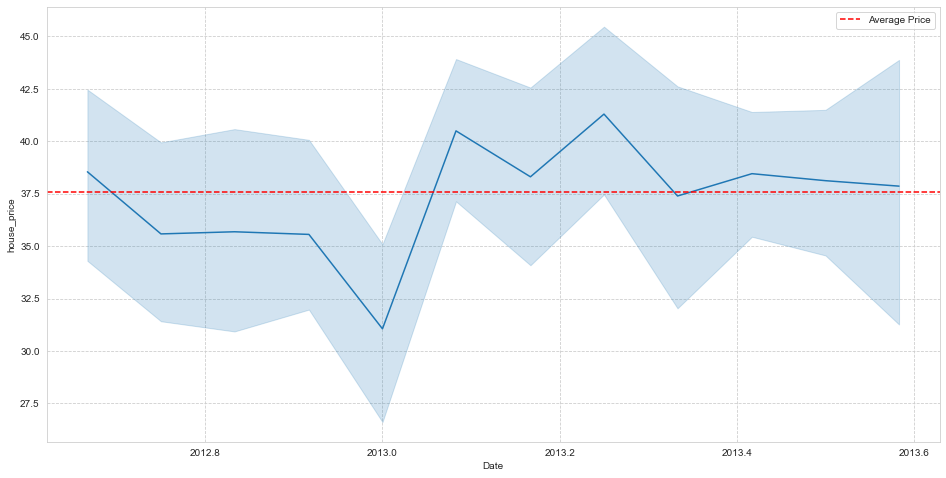

In [178]:
average_price = house['house_price'].mean()

plt.figure(figsize=(16, 8))
sns.lineplot(data=house, x="Date", y='house_price')
plt.axhline(y=average_price, color='r', linestyle='--', label='Average Price')

plt.legend()
plt.show()

- Average monthly house prices of unit area changes from 2012 to 2013. On an average house price per unit area is higher in 2013.



#### correlation between variables

<AxesSubplot:>

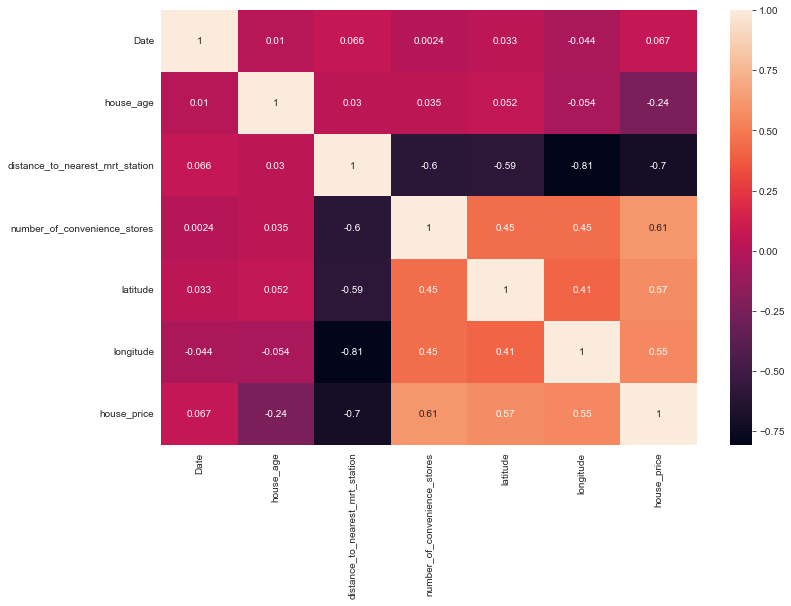

In [116]:
plt.figure(figsize = (12,8))
res = house.corr()
sns.heatmap(res, annot =True)

- House Price is significantly correlated with;

    1.distance to nearest MRT station
    
    2.no.of convnience stores
    
    3.latitude
    
    4.longitude
    

  - these variable may be good contributors for predicting house price.
  
 
 - Also It seems that from other correlation multicollinearity exists between the predictors because distance to nearest MRT station is highly correlated with:
    
    1.no.of convnience stores
    
    2.latitude
    
    3.longitude
 





### Geographical Analysis

lets check the spread of variables on map using plotly express library.

In [120]:
import plotly.express as px

In [182]:
fig = px.scatter_mapbox(df, lat="latitude", 
                        lon="longitude",
                        color = 'house_price',
                        size="house_price",
                        color_continuous_scale=px.colors.carto.Blugrn, 
                        size_max=15,zoom = 10,
                        mapbox_style="carto-positron",title = 'House Price per unit area by location')
fig.show()

<font size="3">The uneven distribution of house prices in Xindian district may be attributed to location-based disparities.
The Western part of the district has lower property prices. In contrast, the North-eastern part has higher house prices.</font>

In [144]:
fig = px.scatter_mapbox(df, lat="latitude", 
                        lon="longitude",
                        color = 'number_of_convenience_stores',
                        size="number_of_convenience_stores",
                        color_continuous_scale=px.colors.carto.Blugrn, 
                        size_max=15,zoom = 10,
                        mapbox_style="carto-positron")
fig.show()

<font size="3"> The highest number of convenience store are in eastern side of the district and it seems that 
it exhibits certain shape along with roads and bridges, there is also perticuler shape in western side along with roads.</font>

In [147]:
fig = px.scatter_mapbox(df, lat="latitude", 
                        lon="longitude",
                        color = 'distance_to_nearest_mrt_station',
                        size="distance_to_nearest_mrt_station",
                        color_continuous_scale=px.colors.carto.Blugrn, 
                        size_max=15,zoom = 10,
                        mapbox_style="carto-positron")
fig.show()

<font size=3>As we see MRT Stations in Xindian district are located in north eastern part of the city so houses that are located in western side of city are far way from the MRT stations approximately 6 km and above so that may lead to lower the property prices in the western side.</font>

In [149]:
fig = px.scatter_mapbox(df, lat="latitude", 
                        lon="longitude",
                        color = 'house_age',
                        size="house_age",
                        color_continuous_scale=px.colors.carto.Blugrn, 
                        size_max=15,zoom = 10,
                        mapbox_style="carto-positron")
fig.show()

<font size = 3> Most of Old houses (30 years above) are located in North Eastern part of the city and also New houses are more
frequent in this area as compare to West and South. There are some old age houses scatter in west and southern part.</font>

In [165]:
fig = px.scatter_mapbox(df, lat="latitude", 
                        lon="longitude",
                        color = 'house_price',
                        size="house_price",
                        color_continuous_scale=px.colors.carto.Pinkyl, 
                        size_max=15,zoom = 10,
                        mapbox_style="carto-positron",animation_frame = 'Date')
fig.show()

<font size =3>From above graph In Central and North Eastern part of city are prone to high value transactions. In fact transactions are reguler throughout the year.</font>

### Model Building and Model Evaluation.

In [1084]:
var = ['Date', 'house_age', 'distance_to_nearest_mrt_station','number_of_convenience_stores','latitude','longitude']
X_ind = house[var]

In [1085]:
# Calculate the VIFs for predictor variables
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
X_ind = house[var]
vif['Features'] = X_ind.columns
vif['VIF'] = [variance_inflation_factor(X_ind.values, i) for i in range(X_ind.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,Date,42617107.03
5,longitude,42015613.56
4,latitude,6147852.54
3,number_of_convenience_stores,4.77
2,distance_to_nearest_mrt_station,4.30
1,house_age,3.46


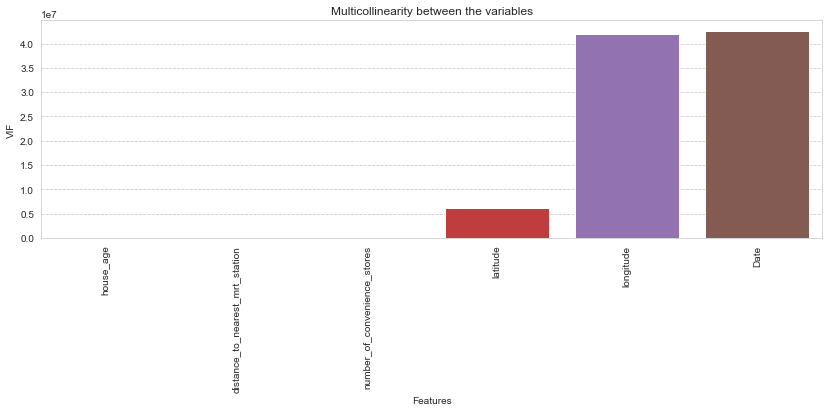

In [1086]:
plt.figure(figsize=(14,4))
sns.barplot(x='Features',y='VIF',data=vif.sort_values('VIF')).set(title='Multicollinearity between the variables')
plt.xticks(rotation=90)
plt.show()

In [1053]:
# lets copy data 
df_house = house.copy()

In [1054]:
df_house.head()

,Date,house_age,distance_to_nearest_mrt_station,number_of_convenience_stores,latitude,longitude,house_price
0,2012.917,32.0,84.87882,10,24.98298,121.54024,37.9
1,2012.917,19.5,306.59470,9,24.98034,121.53951,42.2
2,2013.583,13.3,561.98450,5,24.98746,121.54391,47.3
3,2013.500,13.3,561.98450,5,24.98746,121.54391,54.8
4,2012.833,5.0,390.56840,5,24.97937,121.54245,43.1


In [1055]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV

In [1056]:
# seperate dependent and independent variable
y = df_house.pop('house_price')

feat = [ 'house_age', 'distance_to_nearest_mrt_station','number_of_convenience_stores','latitude']
X = df_house[feat]

In [1057]:
# splitting data into train-test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

### Scaling - Standardization

In [1058]:
y_train = pd.DataFrame(y_train)
y_test = pd.DataFrame(y_test)

In [1059]:
# Scale the Data
from sklearn.preprocessing import StandardScaler
std = StandardScaler()

X_train = std.fit_transform(X_train)
X_test = std.transform(X_test)

y_train = std.fit_transform(y_train)
y_test = std.transform(y_test)

In [1060]:
# creating list of matrix to store the evaluation matrix of all model
mean_sq_error=[]
root_mean_sq_error=[]
r2_list=[]
adj_r2_list=[]

### Function for Train the models

In [1061]:
def train_model(model,X_train,y_train,X_test,y_test):
    
    # Fit Model
    model.fit(X_train,y_train)
    
    # predictions
    preds = model.predict(X_test)
    
    #  Evaluation Metrics
    import math
    from sklearn.metrics import mean_squared_error
    from sklearn.metrics import mean_absolute_error
    from sklearn.metrics import r2_score
    
    print('\n================Model Evaluation==============================================================================\n')
    MSE  = mean_squared_error(y_test,preds)
    print("MSE :" , MSE)
    
    RMSE = np.sqrt(MSE)
    print("RMSE :" ,RMSE)
    
    r2 = r2_score(y_test,preds)
    print("R2 :" ,r2)
    
    adj_r2=1-(1-r2_score(y_test,preds))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)) 
    print("Adjusted R2 : ",adj_r2)


    print('\n======================================================================================\n')
    
    mean_sq_error.append(MSE)
    root_mean_sq_error.append(RMSE)
    r2_list.append(r2)
    adj_r2_list.append(adj_r2)

    # plot 
    print('\n===========================Evaluation plot======================================================================\n') 
    plt.figure(figsize=(20,10))
    plt.plot(np.array(y_test[:100]))
    plt.plot(preds[:100])
    plt.title('Actual and Predicted', fontsize=20)
    plt.legend(["Actual","Predicted"],prop={'size': 20})
    plt.show()
    
    # Residual Analysis
    print('\n===========================Residual Analysis====================================================================\n')
    plt.figure(figsize=(20,10))
    res = y_test - preds
    sns.distplot(res)
    plt.xlabel('Residuals')
    plt.show()
    

#### Linear Regression

In [1062]:
from sklearn.linear_model import LinearRegression

In [1063]:
# linear regression model
linear_model= LinearRegression()


================Model Evaluation==============================================================================

MSE : 0.3113248363713748
RMSE : 0.5579649060392372
R2 : 0.6229731782365672
Adjusted R2 :  0.610300007757124



===========================Evaluation plot======================================================================



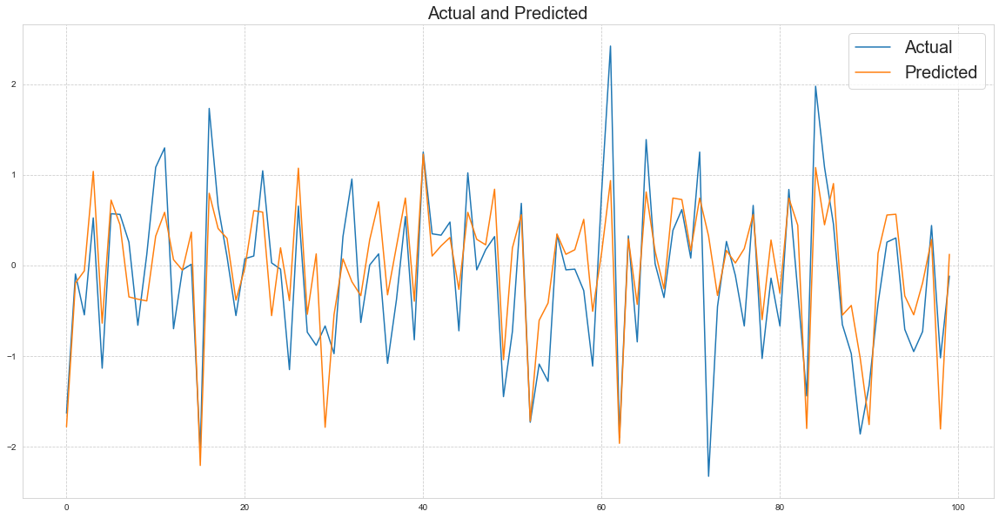


===========================Residual Analysis====================================================================



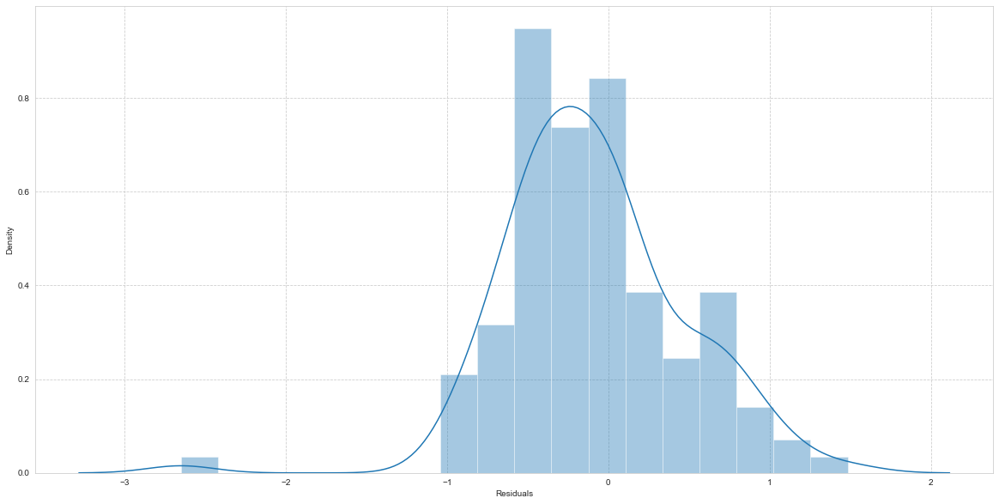

In [1064]:
# callling train_model
train_model(linear_model, X_train, y_train, X_test, y_test)

#### Ridge Regression

In [1065]:
# Ridge Regression
from sklearn.linear_model import Ridge
ridge = Ridge()

# finding the best parameters for ridge model by gridsearchcv
param_grid = {'alpha': [0.1, 1.0, 10.0]}
ridge_grid = GridSearchCV(ridge, param_grid, scoring='r2', cv=5)


================Model Evaluation==============================================================================

MSE : 0.3108204453965589
RMSE : 0.5575127311519971
R2 : 0.6235840158696244
Adjusted R2 :  0.6109313777475949



===========================Evaluation plot======================================================================



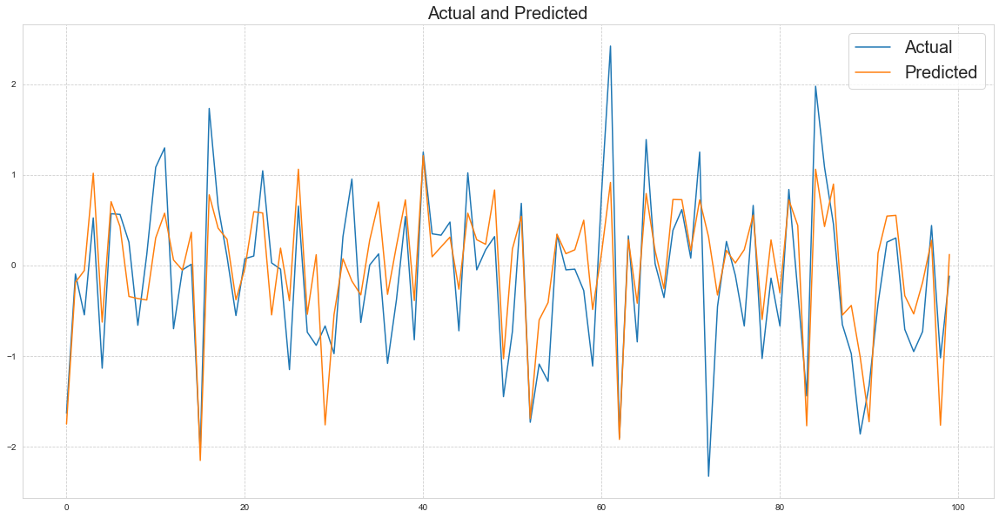


===========================Residual Analysis====================================================================



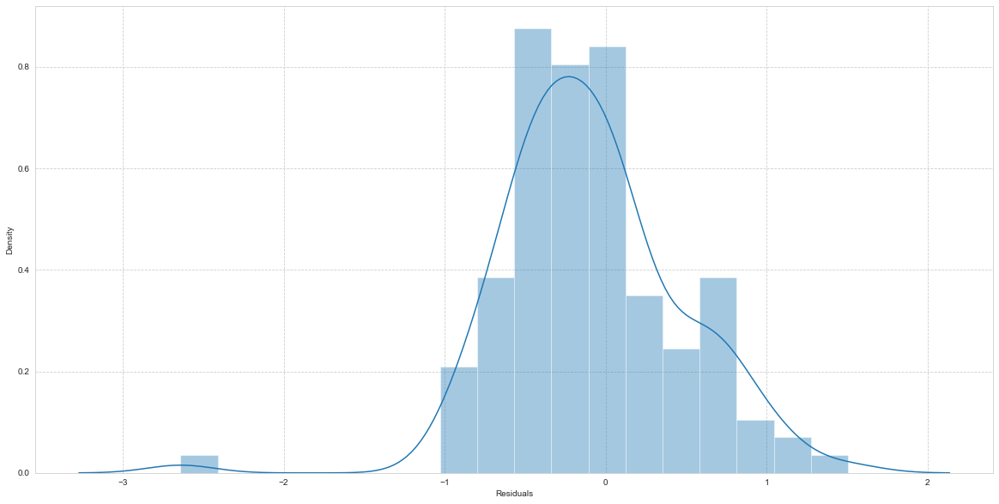

In [1066]:
# calling train_model to train,fit and evaluation of ridge model
train_model(ridge_grid,X_train,y_train,X_test,y_test)

#### Lasso

In [1067]:
from sklearn.linear_model import Lasso

In [1068]:
# finding the best parameters for lasso by gridsearchcv
lasso_model = Lasso()

# setting the parameters of the lasso model
param_grid = {'alpha': [0.1, 1.0, 10.0]}
lasso_grid = GridSearchCV(lasso_model, param_grid, scoring='r2', cv=5)


================Model Evaluation==============================================================================

MSE : 0.33566610264204383
RMSE : 0.579366984425281
R2 : 0.5934949317635478
Adjusted R2 :  0.5798308958564402



===========================Evaluation plot======================================================================



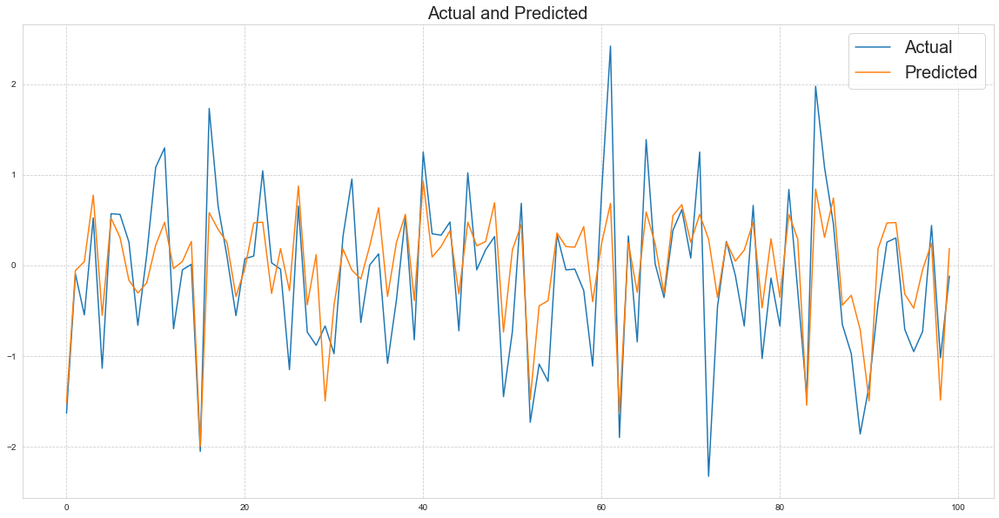


===========================Residual Analysis====================================================================



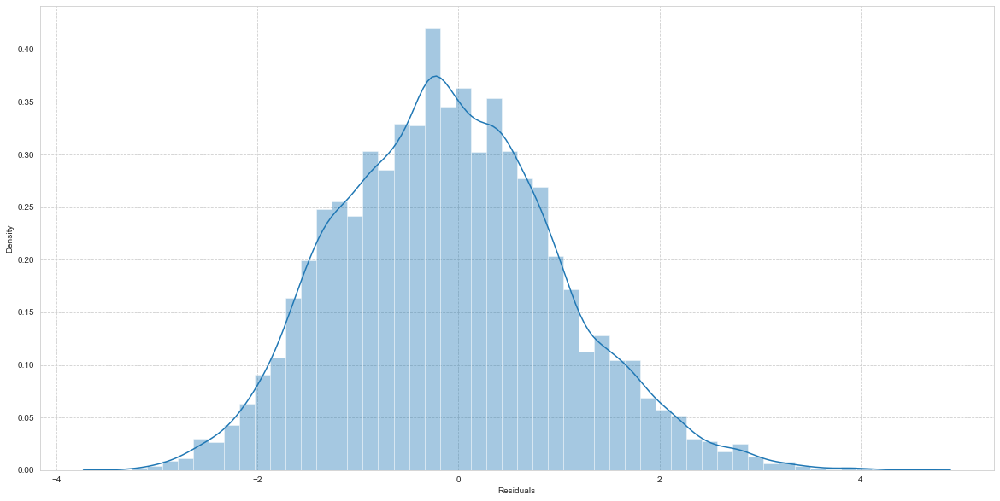

In [1069]:
train_model(lasso_grid,X_train,y_train,X_test,y_test)

#### Random Forest Regressor

In [1070]:
# importing Random forest

from sklearn.ensemble import RandomForestRegressor

In [1071]:
# creating model of random forest
rf_model = RandomForestRegressor()

In [1072]:
# creating param grid dict to check random forest with diffirent value of parameter through gridsearch
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

In [1073]:
# creating rf_grid model to run rf model with gridsearch
rf_grid= GridSearchCV(rf_model,param_grid=param_grid,verbose=0)


================Model Evaluation==============================================================================

MSE : 0.1844266633725198
RMSE : 0.4294492558760811
R2 : 0.7766519383733658
Adjusted R2 :  0.7691444405035629



===========================Evaluation plot======================================================================



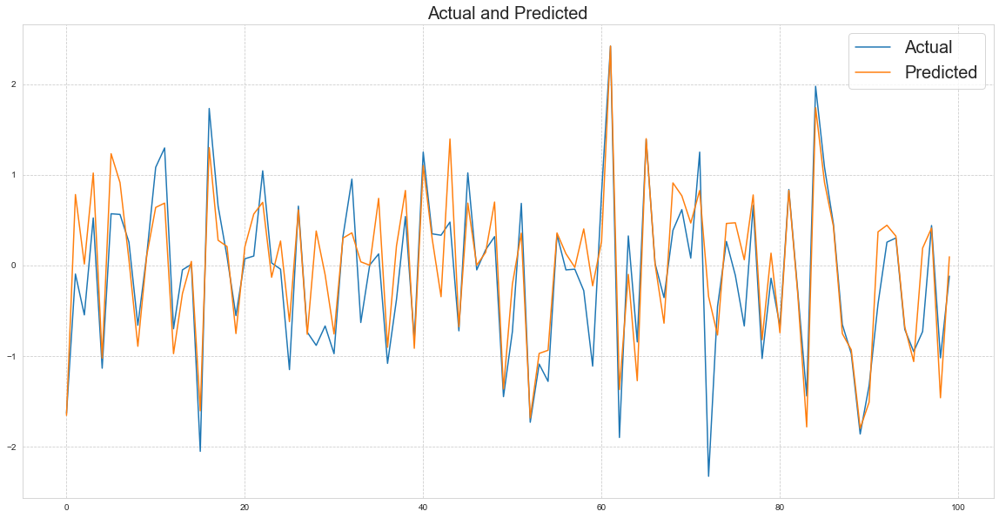


===========================Residual Analysis====================================================================



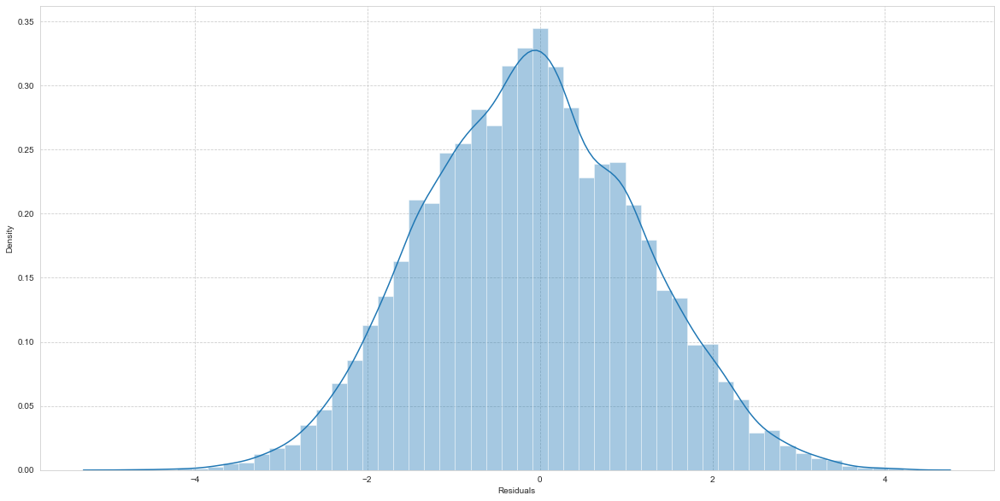

In [1074]:
# calling run_model to train,fit and evalution of random forest model
train_model(rf_grid,X_train,y_train,X_test,y_test)

In [1075]:
# optimal rf model
optimal_rf_model = rf_grid.best_estimator_

In [1076]:
def get_features_importance (optimal_model,X_train):
  
  #shows the graph of feature importance
  
  features = X.columns
  importances = optimal_model.feature_importances_
  indices = np.argsort(importances)

  plt.figure(figsize=(15,10))
  plt.title('Feature Importance')
  plt.barh(range(len(indices)), importances[indices], color='orange', align='center')
  plt.yticks(range(len(indices)), [features[i] for i in indices])
  plt.xlabel('Relative Importance')

  plt.show()

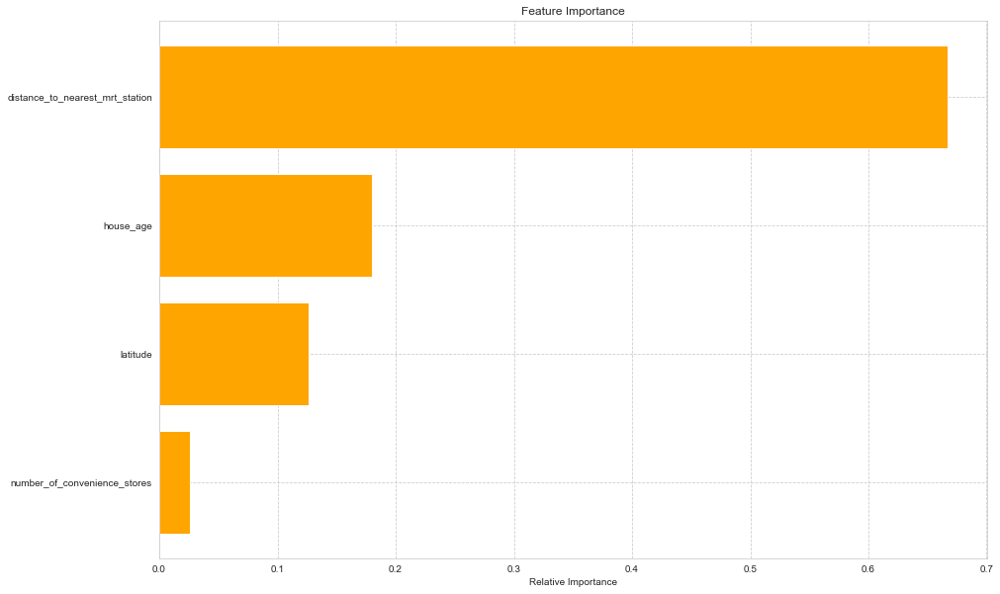

In [1077]:
# getting and visualizing features importance  of rf model
get_features_importance(optimal_rf_model,X_train)

### Create DataFrame of Metrices to compare

In [1078]:
# creating dictionary to store all the metrices 

matrices={'Mean_square_error':mean_sq_error,'Root_Mean_square_error':root_mean_sq_error,'R2':r2_list,'Adjusted_R2':adj_r2_list}
all_model_matrices

{'Mean_square_error': [0.3113248363713748,
  0.3108204453965589,
  0.33566610264204383,
  0.1844266633725198],
 'Root_Mean_square_error': [0.5579649060392372,
  0.5575127311519971,
  0.579366984425281,
  0.4294492558760811],
 'R2': [0.6229731782365672,
  0.6235840158696244,
  0.5934949317635478,
  0.7766519383733658],
 'Adjusted_R2': [0.610300007757124,
  0.6109313777475949,
  0.5798308958564402,
  0.7691444405035629]}

In [1079]:
model_name=['LinearRegression','Ridge','Lasso','RandomforestRegressor']

In [1080]:

matrices_df=pd.DataFrame.from_dict(matrices,orient="index",columns=model_name)

In [1081]:
matrices_df

,LinearRegression,Ridge,Lasso,RandomforestRegressor
Mean_square_error,0.311325,0.310820,0.335666,0.184427
Root_Mean_square_error,0.557965,0.557513,0.579367,0.429449
R2,0.622973,0.623584,0.593495,0.776652
Adjusted_R2,0.610300,0.610931,0.579831,0.769144


In [1082]:

final_matrices=matrices_df.transpose().reset_index().rename(columns={'index':'Models'})
final_matrices

,Models,Mean_square_error,Root_Mean_square_error,R2,Adjusted_R2
0,LinearRegression,0.311325,0.557965,0.622973,0.610300
1,Ridge,0.310820,0.557513,0.623584,0.610931
2,Lasso,0.335666,0.579367,0.593495,0.579831
3,RandomforestRegressor,0.184427,0.429449,0.776652,0.769144


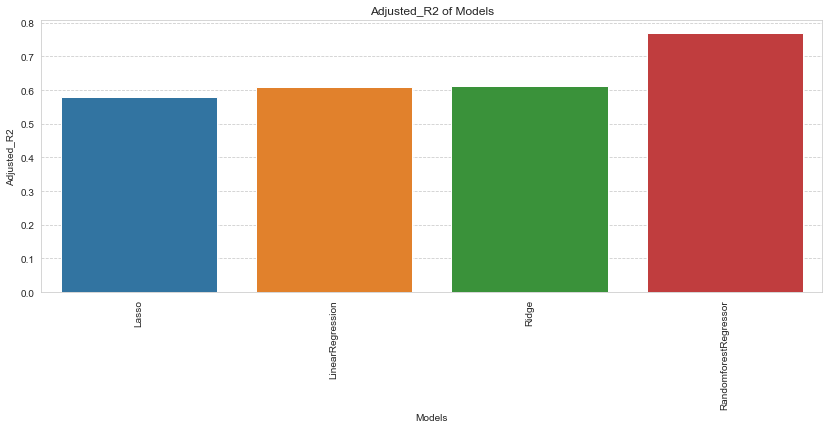

In [1087]:
# creating bar plot to visualize the Adjusted R2 of model 
plt.figure(figsize=(14,5))
sns.barplot(x='Models',y='Adjusted_R2',data=final_matrices.sort_values('Adjusted_R2')).set(title='Adjusted_R2 of Models')
plt.xticks(rotation=90);

### Conclusion:

1. From EDA more than 50% of the properties are Scattered near MRT Stations within the distance of (1 KM).


2. Proportion of old houses are more than newly constructed especially in North Eastern part of the city.


3. house age is significantly affect the house price except some cases.


4. Distance between the mrt stations and property location is most important factor affecting the property prices.

   minimum distance leads to higher prices.
   

5. No.of convenience stores slightly affect the house prices it is least important factor.


6. Average monthly house prices in 2013 is slightly higher than 2013 may be because of inflation and other economic factors.


7. Geographically the uneven distribution of house prices in Xindian district may be attributed to location-based disparities.
   The Western part of the district has lower property prices. In contrast, the North-eastern part has higher house prices.
   
   
8. The highest number of convenience store are in eastern side of the district and it seems that it exhibits certain shape along    with roads and bridges, there is also perticuler shape in western side along with roads.


9. MRT Stations in Xindian district are located in north eastern part of the city so houses that are located in western side of   city are far way from the MRT stations approximately 6 km and above so that may lead to lower the property prices in the         western side.


10. Most of Old houses (30 years above) are located in North Eastern part of the city and also New houses are more frequent in      this area as compare to West and South. There are some old age houses scatter in west and southern part.


11. Central and North Eastern parts of city are prone to high value transactions. In fact transactions are reguler throughout       the year.


12. After applying four different models the Random Forest Regressor model found to be the best model that can be used for the       predicting the house price per unit area. Performace metrices of RF model are higher than other models.


13. Distance to nearest MRT Station, house age and latitude are the most important factors for predicting house price in Xindian 
    district.